###  Developing stocks  trading strategies based on technical analysis
Investors and traders use different methods to decide entry and exit points for trading stocks. Some of the most popular strategies used by traders  are bollinger bands, relative strength index and MACD. In this notebook, I will develop Bollinger Band Strategy using python and explore major stocks and etfs to see if profitable trading models can be developed using Bollinger Band Strategy.



### Bollinger Bands
Bollinger band strategy is mean reverting strategy and is based on the assumption that market can be over bought and over sold. At the most basic level when a stock is oversold traders make an entry long positon (buy the stock)  and exit the long position ( sell the stock .

The bollinger band strategy can be modified according to the intuitiveness, but generally it uses a 20 days simple moving average with 2 standard deviation for deciding upper and lower bound of bollinger band.

## Installing Libraries

In [1]:
%%capture
!pip install yfinance
!pip install pandas
!pip install matplotlib
!pip install seaborn
!pip install joblib
!pip install seaborn
!pip install numpy
%%capture
## https://github.com/Worlddatascience/DataScienceCohort/blob/master/6_How_to_Create_a_Candlestick_Chart_using_Python.ipynb
!pip install cufflinks
## Code to Install Backtrader
!pip install backtrader 


## Importing necessary packages

In [2]:
import yfinance
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import cufflinks as cf   #A powerful data visualization library used for Financial Data Science processes
from plotly.offline import iplot, init_notebook_mode #Plotly and cufflinks work in conjunction

cf.go_offline() #gives ability to plot offline
init_notebook_mode() #gives ability to plot things proportionately in the notebook


In [3]:
! pip install -U kaleido
import warnings
warnings.filterwarnings('ignore')
import kaleido
import plotly.io as pio


 ###  Function for bollinger band
> 1.Yahoo finance api is used to obtain the data for stocks and etfs( exchange traded funds)

> 2.Main variables for bollinger band strategy are:
>> - Stock Symbol(name)
>> - frequency of stock price collection (frequency)
>> - Starting Date (first)
>> - Endinng Date (last)
>> - No of periods for collecting simple moving average (period)
>> - No of standard deviation for deciding upper and lower bound (multiplier) 
>> - Total investment values (investment_value)
     
**The below function will show the total profit by the strategy and the profit if invested only one time, along with the chart with buy and sell points. It will also show the candle stick plot with RSI and volume**

In [4]:

##https://medium.com/codex/algorithmic-trading-with-bollinger-bands-in-python-1b0a00c9ef99
## https://github.com/Worlddatascience/DataScienceCohort/blob/master/6_How_to_Create_a_Candlestick_Chart_using_Python.ipynb
#def stock(name,start,end):
def bol_band_strategy(name="QQQ",frequency="1d",first="2019-11-4", last="2022-11-15",period=20,multiplier=1.7,investment_value = 100000):
    ticker = yfinance.Ticker(name)
    df = ticker.history(interval=frequency,start=first,end=last)
    df['MiddleBand']= df['Close'].rolling(period).mean()
    df['UpperBand'] = df['Close'].rolling(period).mean() + df['Close'].rolling(period).std() * multiplier
    df['LowerBand'] = df['Close'].rolling(period).mean() - df['Close'].rolling(period).std() * multiplier
    #return df
    #def implement_bb_strategy(data, lower_bb, upper_bb):
    buy_price = []
    sell_price = []
    bb_signal = []
    signal = -1
    #data=df['Close']
    #lower_bb=df['LowerBand']
    #upper_bb=df['UpperBand']
    
    for i in range(len(df['Close'])):
        if df['Close'][i-1] > df['LowerBand'][i-1] and df['Close'][i] < df['LowerBand'][i]:
            if signal != 1:
                buy_price.append(df['Close'][i])
                sell_price.append(np.nan)
                signal = 1
                bb_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                bb_signal.append(0)
        elif df['Close'][i-1] < df['UpperBand'][i-1] and df['Close'][i] > df['UpperBand'][i]:
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(df['Close'][i])
                signal = -1
                bb_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                bb_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            bb_signal.append(0)
    df['buy_price']=buy_price
    df['sell_price']=sell_price
    df['bb_signal']=bb_signal 
        
    #return df
    position = []
    
    for i in range(len(df['bb_signal'])):
        if df['bb_signal'][i] > 1:
            position.append(1)
        else:
            position.append(0)
    
        
    for i in range(len(df['Close'])):
        if df['bb_signal'][i] == 1:
            position[i] = 1
        elif df['bb_signal'][i] == -1:
            position[i] = 0
        else:
            position[i] = position[i-1]
    df['position']=position
    df['return']=df['Close'].diff()
    bb_strategy_ret = []

    for i in range(len(df['return'])):
        try:
            returns = df['return'][i]*df['position'][i]
            bb_strategy_ret.append(returns)
        except:
            pass
    df['bb_returns']=bb_strategy_ret
    #profit_percentage = round((100*sum(df['buy_price'])-sum(df['sell_price']))/(sum(df['buy_price'])),2)
    #total_buy=np.sum((df['buy_price']))
    #total_sell=np.sum((df['sell_price']))
    buy=[item for item in df['buy_price']  if str(item) != 'nan']
    sell=[item for item in df['sell_price']  if str(item) != 'nan']
    if len(buy)==len(sell):
        #buy=list
        #buy=[item for item in df1['buy_price']  if str(item) != 'nan']
        total_buy=np.sum(buy)
        total_sell=np.sum(sell)
        buy_sell_diff=total_sell-total_buy
        profit_percentage=round((buy_sell_diff/total_buy)*100,2)
        #print('Profit percentage of the BB strategy : {}%'.format(profit_percentage))
    else:
        total_buy=np.sum(buy[:-1])
        total_sell=np.sum(sell)
        buy_sell_diff=total_sell-total_buy
        profit_percentage=round((buy_sell_diff/total_buy)*100,2)
    #return total_sell,total_buy
    #buy_sell_diff=total_sell-total_buy
    #profit_percentage=round((buy_sell_diff/total_buy)*100,2)
    print('Profit percentage of the BB strategy : {}%'.format(profit_percentage))
    Profit_oneinvest=round(((df['Close'][-1]-df['Close'][0])/(df['Close'][0])*100),2)
    print('Total profit by just investing one time in{}'.format(name),'is{}%'.format(Profit_oneinvest))
    plt.rcParams['figure.figsize'] = [12,12]
    plt.rc('font', size=14)
    df['Close'].plot(label = 'CLOSE PRICES', alpha = 0.4)
    df['UpperBand'].plot(label = 'UPPER BB', linestyle = '--', linewidth = 1, color = 'black')
    df['MiddleBand'].plot(label = 'MIDDLE BB', linestyle = '--', linewidth = 1.2, color = 'grey')
    df['LowerBand'].plot(label = 'LOWER BB', linestyle = '--', linewidth = 1, color = 'black')
    plt.scatter(df.index,df['buy_price'], marker = '^', color = 'green', label = 'BUY', s = 50)
    plt.scatter(df.index,df['sell_price'], marker = 'v', color = 'red', label = 'SELL', s = 50)
    plt.title(name)
    plt.legend(loc = 'upper right')
    plt.show()
    plt.rcParams['figure.figsize'] = [16,16]
    plt.rc('font', size=14)
    Candlestick= cf.QuantFig(df, title=name, legend='top', name=name)
    Candlestick.add_volume() 
    Candlestick.add_rsi(periods=14, color='green') 
    Candlestick.iplot()
    

In [5]:
%%capture
! pip install openpyxl

### Testing bollinger band strategy for uptrending market 
### QQQ
 - QQQ, which is a exchange traded fund and follows nasdaq 100 index is explored for analysis

    As we are aware that NASDAQ overall is in uptrend for last decade, first I will test using long term trend.


Profit percentage of the BB strategy : 2.23%
Total profit by just investing one time inQQQ is584.23%


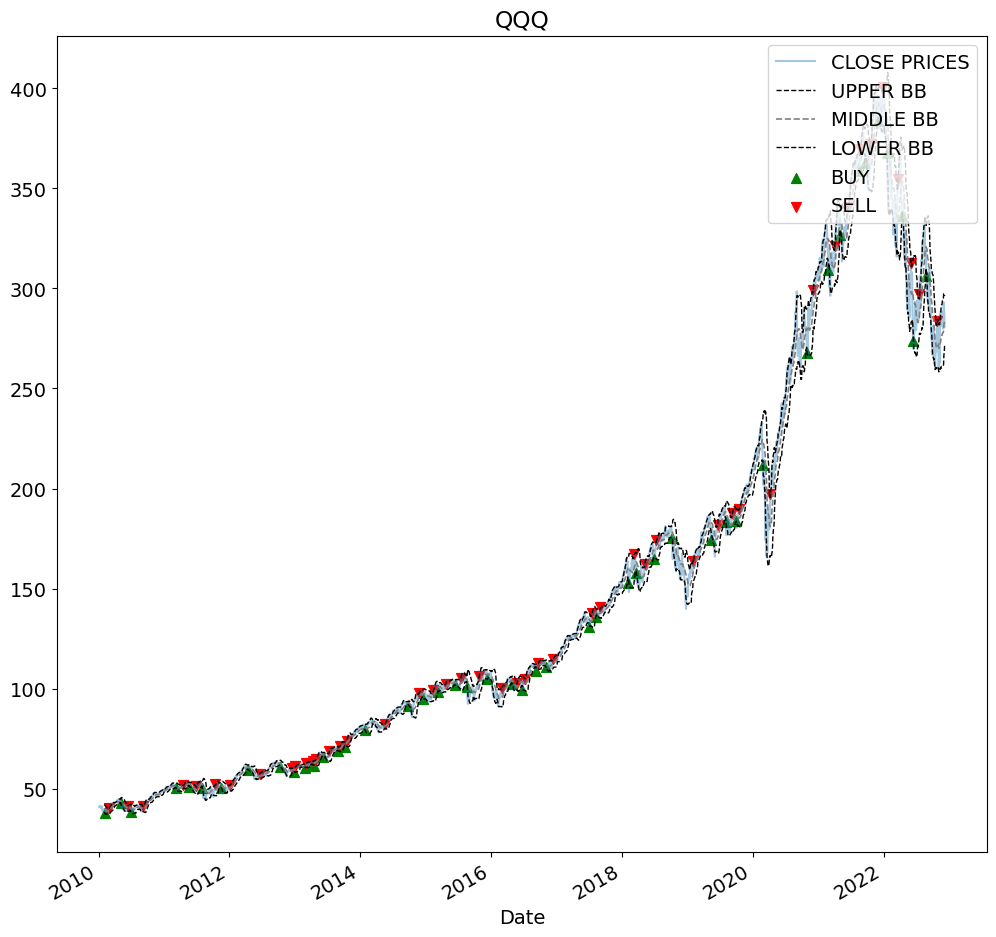

In [7]:
bol_band_strategy("QQQ","1d","2010-01-4","2022-12-07",investment_value = 100000)

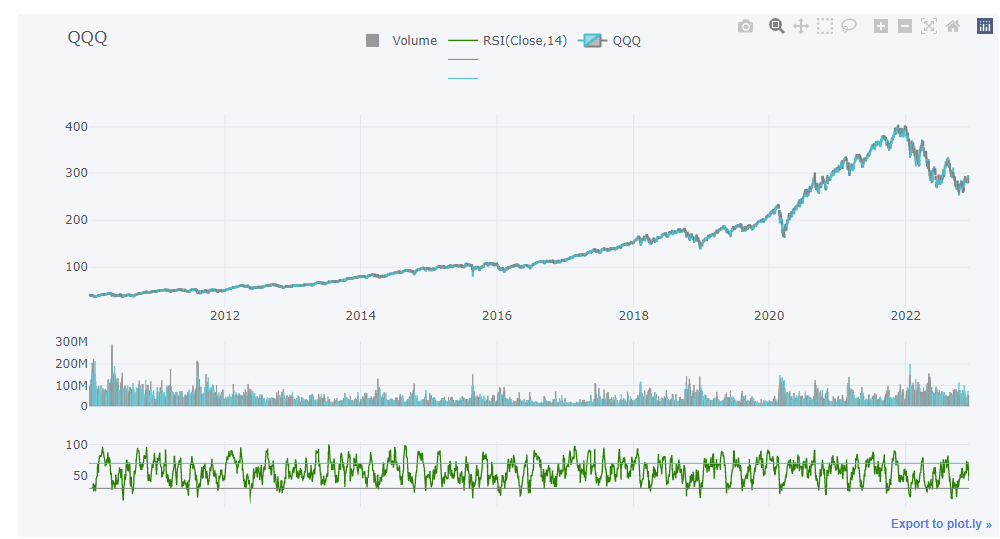

###  Testing Bollinger Band for down market
### QQQ
- 2022 has been bad year for stocks, and I have tested the bollinger band strategy for this period for ETF QQQ

Profit percentage of the BB strategy : 0.37%
Total profit by just investing one time inQQQ is-28.6%


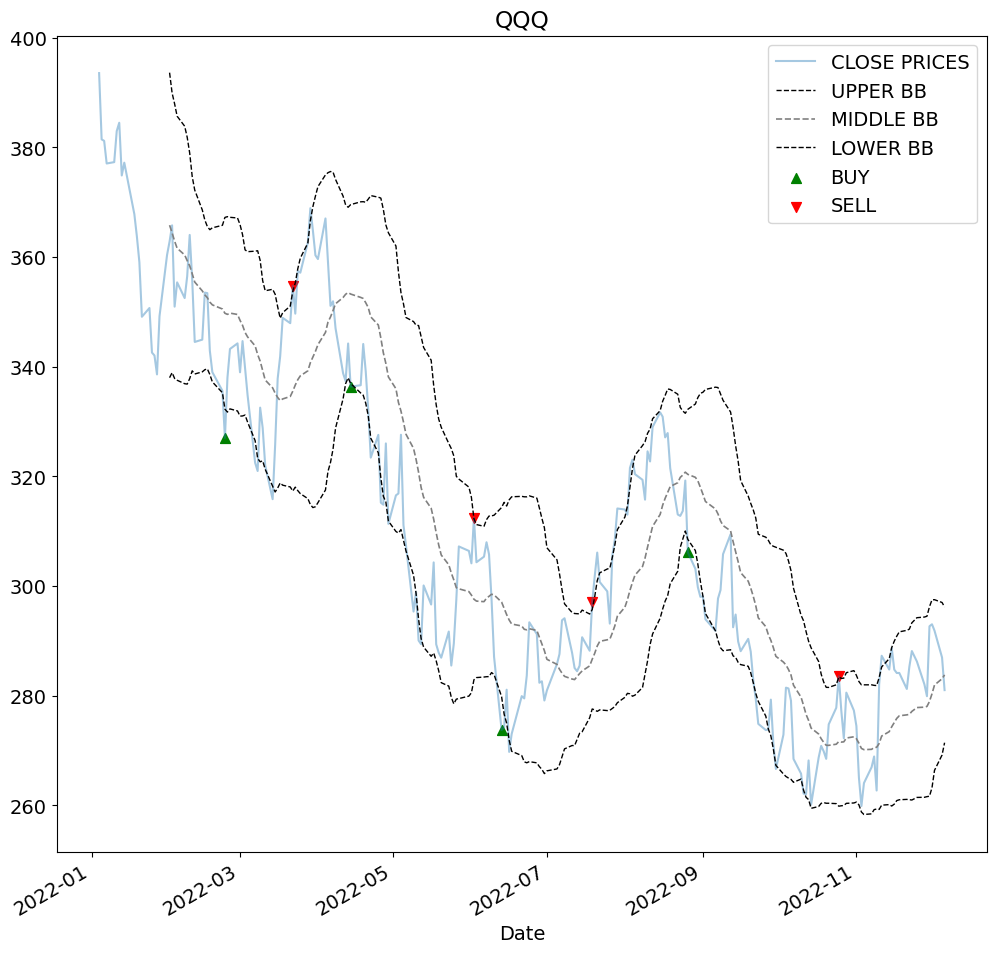

In [8]:

bol_band_strategy("QQQ","1d","2022-01-4","2022-12-07",investment_value = 100000)

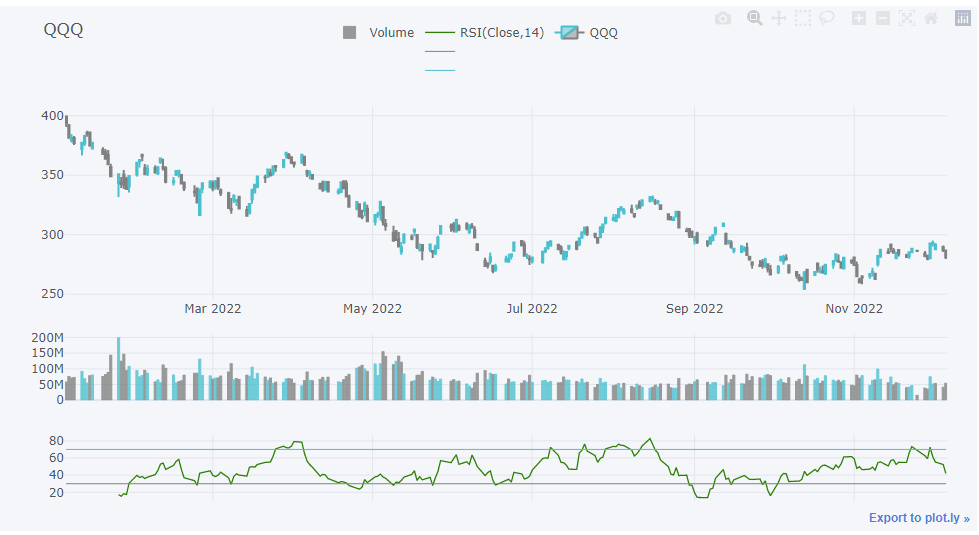

- It,s clear Bollinger Band strategy gave better returns, when the market is trending down mainly due to the fact that it is based on mean reversion

### Testing bollinger band strategy for uptrending market 
### SPY
 - SPY, which is a exchange traded fund and follows S&P 500  index is explored for analysis

    As we are aware that S&P overall is in uptrend for last decade, first I will test using long term trend.


Profit percentage of the BB strategy : 1.93%
Total profit by just investing one time inSPY is343.2%


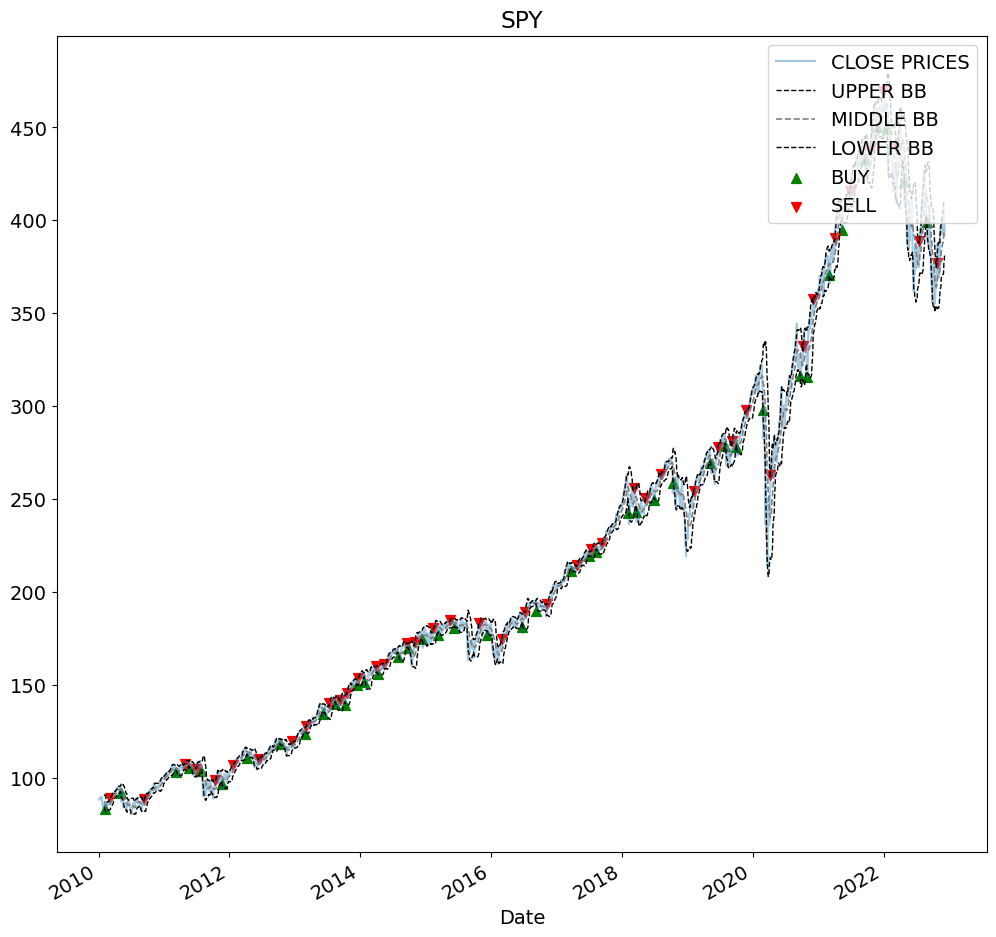

In [10]:
bol_band_strategy("SPY","1d","2010-01-4","2022-12-07",investment_value = 100000)

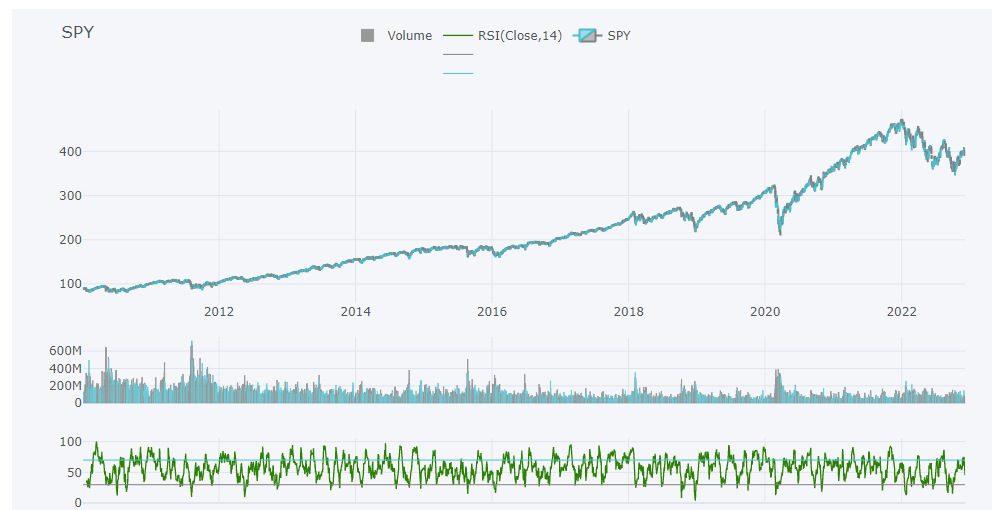

###  Testing Bollinger Band for down market
### SPY
- 2022 has been bad year for stocks, and I have tested the bollinger band strategy for this period for ETF SPY

Profit percentage of the BB strategy : -2.44%
Total profit by just investing one time inspy is-16.58%


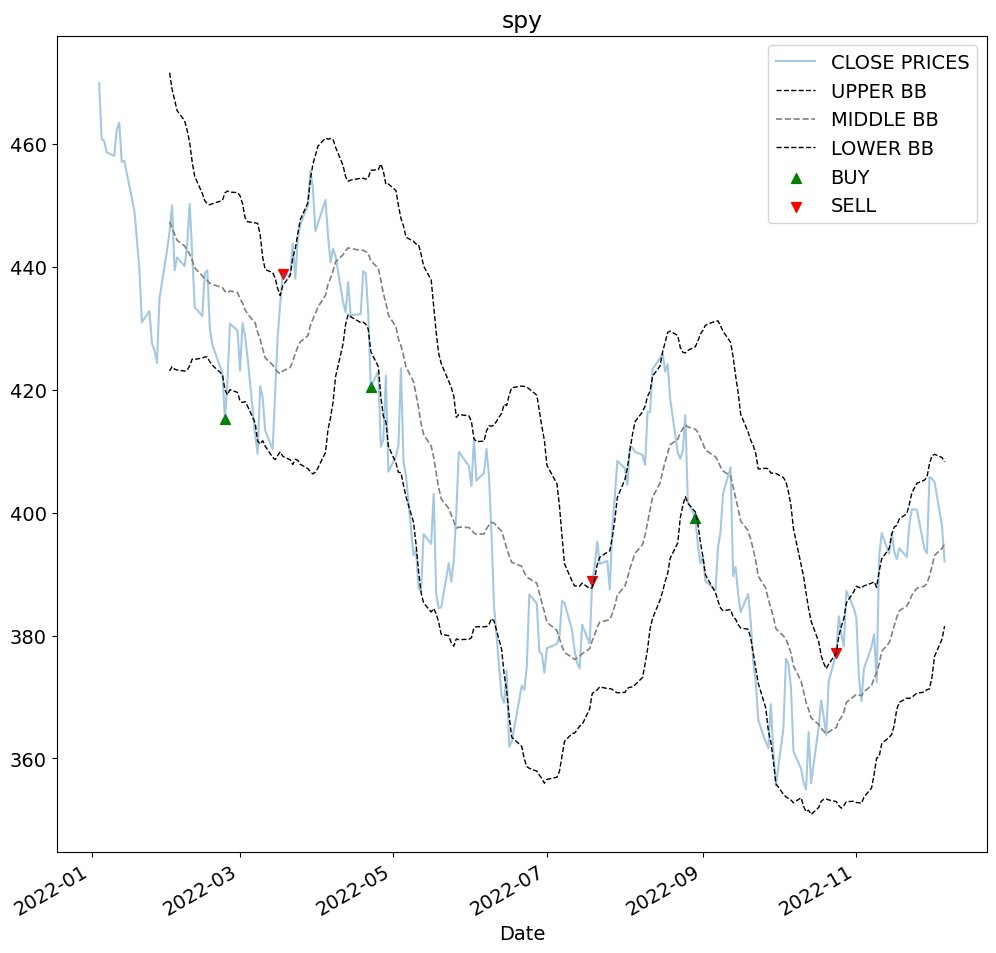

In [11]:
bol_band_strategy("spy","1d","2022-01-4","2022-12-07",investment_value = 100000)

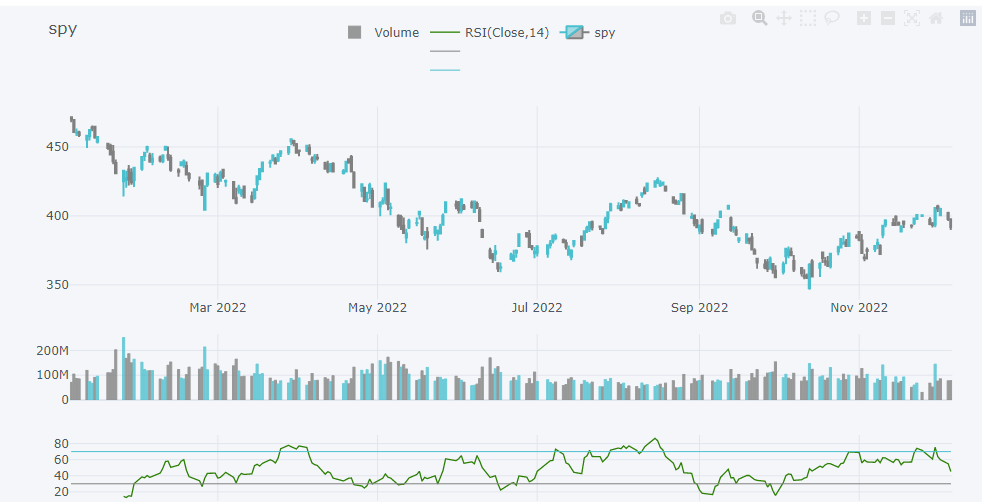

- It,s clear Bollinger Band strategy gave better returns even for SPY, when the market is trending down mainly due to the fact that it is based on mean reversion

### Testing bollinger band strategy for uptrending market 
### DIA
 - DIA, which is a exchange traded fund and follows Dow Jonesindex is explored for analysis

    As we are aware that Dow Jones overall is in uptrend for last decade, first I will test using long term trend.


Profit percentage of the BB strategy : 1.86%
Total profit by just investing one time inDIA is325.03%


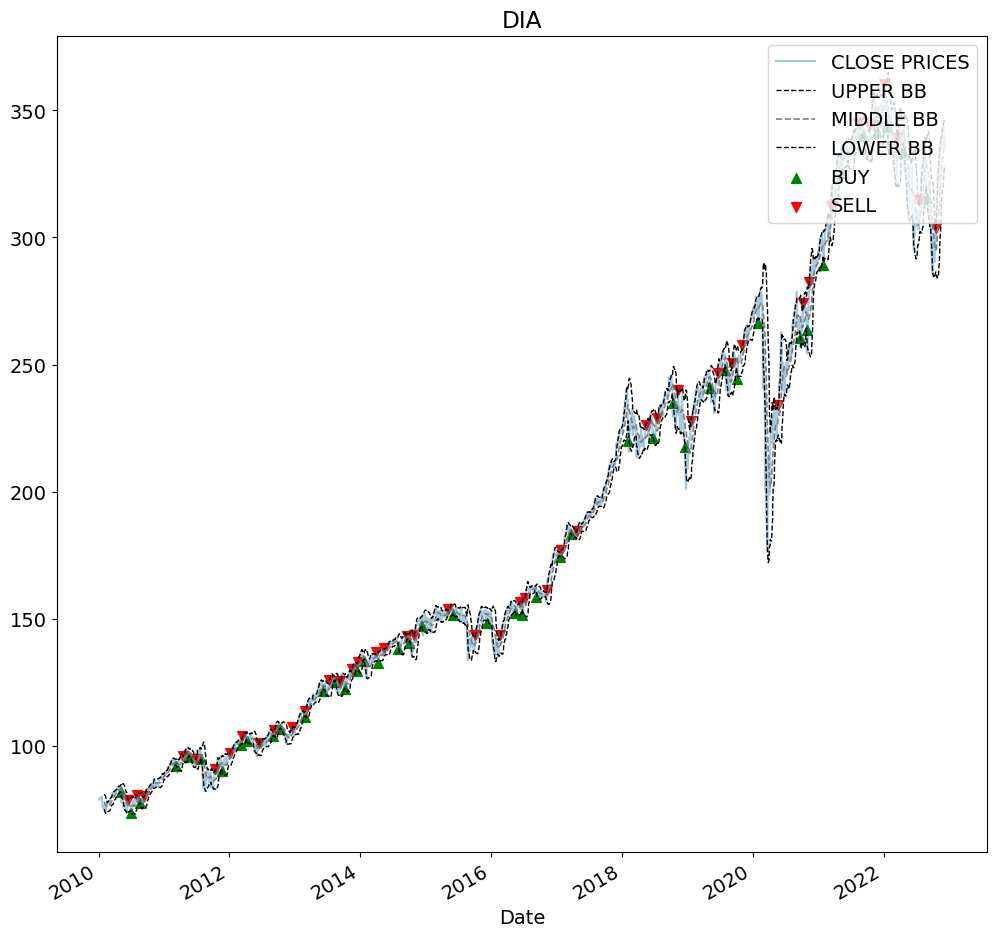

In [12]:
bol_band_strategy("DIA","1d","2010-01-4","2022-12-07",investment_value = 100000)

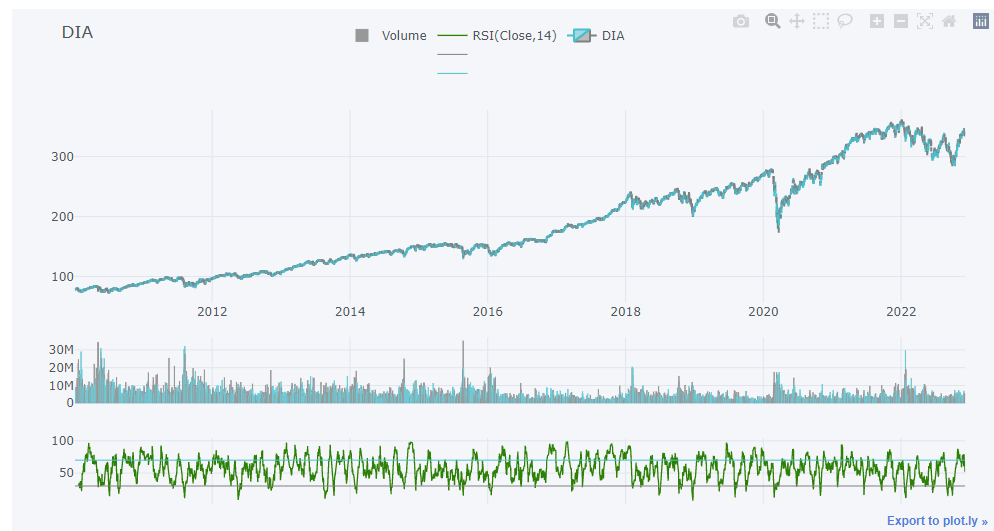

###  Testing Bollinger Band for down market
### DIA
- 2022 has been bad year for stocks, and I have tested the bollinger band strategy for this period for ETF DIA

Profit percentage of the BB strategy : -2.11%
Total profit by just investing one time inDIA is-6.95%


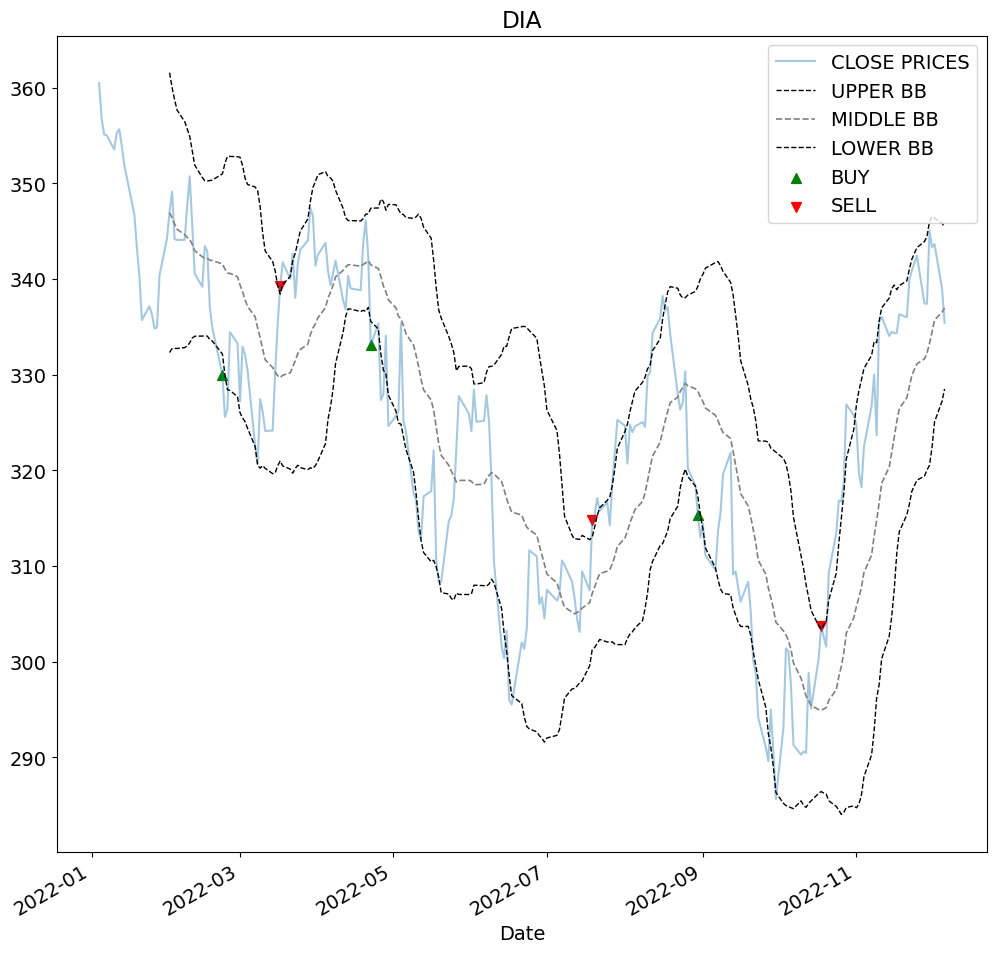

In [13]:
bol_band_strategy("DIA","1d","2022-01-4","2022-12-07",investment_value = 100000)

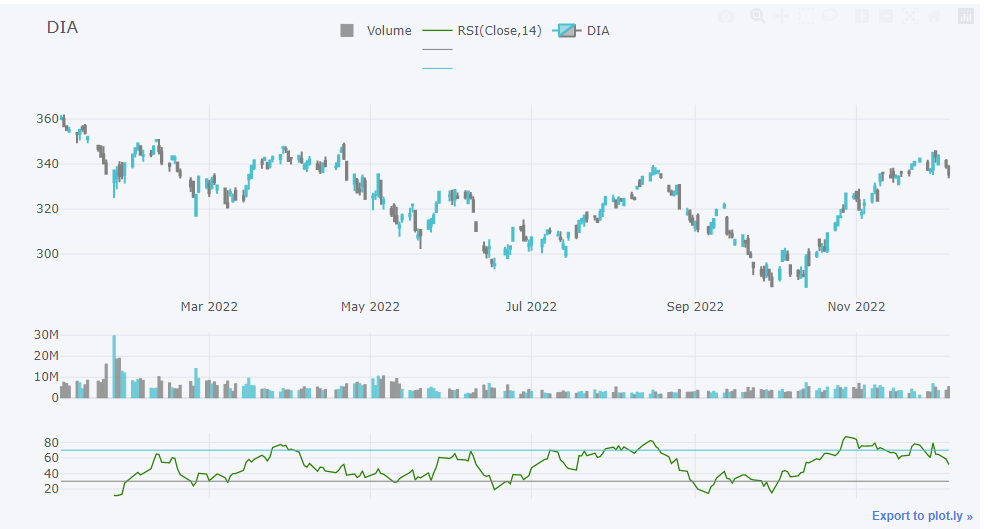

- It,s clear Bollinger Band strategy gave better returns for DIA also, when the market is trending down mainly due to the fact that it is based on mean reversion

### Testing bollinger band strategy for non-trending market
### VYM
 - VYM, which is a high dividend yield xchange traded fund and has remained more or less steady over the period of last one year is evaluated to see if outperforms buy and hold strategy



Profit percentage of the BB strategy : 1.58%
Total profit by just investing one time inVYM is-0.33%


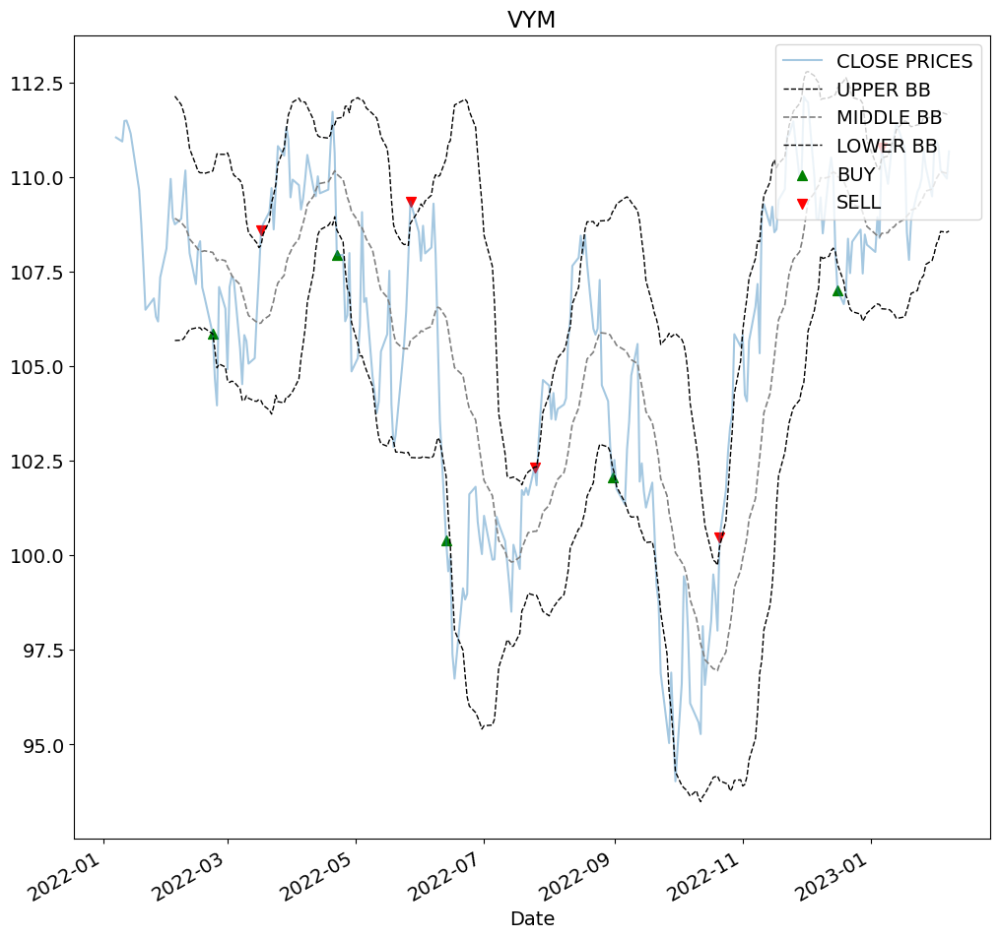

In [31]:
bol_band_strategy("VYM","1d","2022-01-07","2023-02-08",investment_value = 100000)

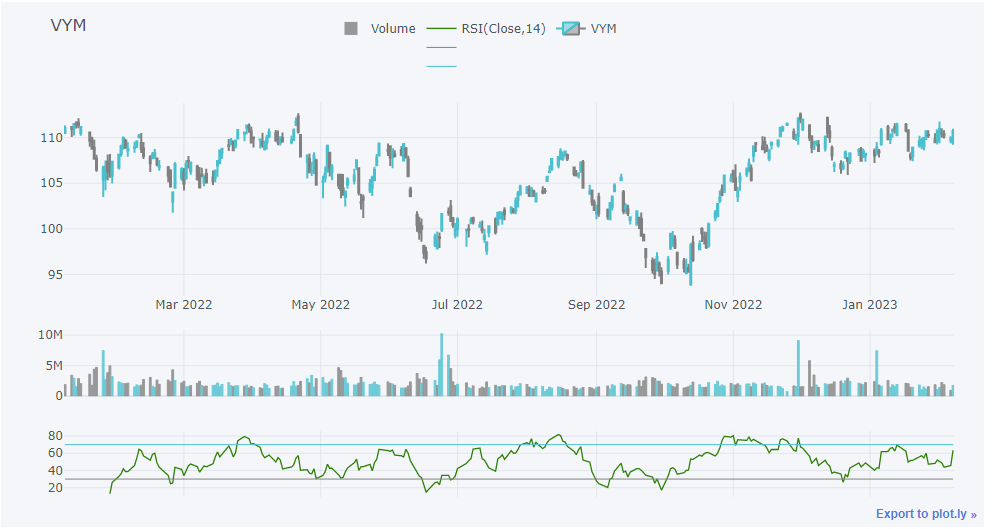


### Summary 

- Bollinger band strategy performs poorly in an uptrending market
- It performs better compared to buy and hold strategy in non-trending and down-trending market

### Further Work
- Bollinger band strategy is generally used by traders for getting signals for making buy and sell decisions. The stategy can be modified using different period for calculating moving average, along with modifying the upper and lower limit of bollinger bands by altering the no. of standard deviations from the mean. In the future,variables can be modified to see if they perform better